### AUCell notes

Overall process:

1. Convert expression matrix to rankings matrix
2. for a given gene set calculate AUC for a given threshold top percentage of genes (default to 5%) in the "recovery curve"
3. add auc scores to a growing vector for each gene signature
4. process auc scores for all gene signatures

Various notes:

The AUC estimates the proportion of genes in the gene-set that are highly expressed in each cells. Cells highgly expressing many genes from the signature will have higher AUC values.

AUC represents the proportion of genes expressed in the signature.



In [81]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import os
import numpy as np
import pandas as pd
import anndata as ad 
import squidpy as sq
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sb
import scvi 
import torch #pytorch
import runpy
from datetime import datetime
import celltypist
from celltypist import models

from os import sys
sys.path.append('/tmp/work/Visium/BRCA_2024/brca_scripts')


from visiumPipeline import processVisium
from applySignatures import cosineSignatures


sc.set_figure_params(figsize=(4,4))
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

#gettting model for celltypist
models.download_models(force_update = True)
model = models.Model.load(model = 'Immune_All_High.pkl')

#define sample poths, sample names and emptry dictionary

samples = ['2018838/PRE-01','2018838/PRE-02','2018838/POST-03','2018838/POST-05',
           '2018839/PRE-04','2018839/PRE-05','2018839/POST-06','2018839/POST-11']

sample_names = [os.path.basename(sample) for sample in samples]
visium_samples = variables = {name: None for name in sample_names} #variable names associated with emptry values in dictionary for storing data later

#process each of the samples

start_time = datetime.now()

for i in range(len(samples)):
    print('\n')
    print('Beginng to process '+sample_names[i])
    print('\n')
    visium_samples[sample_names[i]] = processVisium(samples[i],model)    
    
end_time = datetime.now()
execution_time = end_time - start_time
print('\n')
print(f"Execution time: {execution_time}")

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 50
📂 Storing models in /root/.celltypist/data/models
💾 Downloading model [1/50]: Immune_All_Low.pkl
💾 Downloading model [2/50]: Immune_All_High.pkl
💾 Downloading model [3/50]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/50]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/50]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [6/50]: Adult_Human_Skin.pkl
💾 Downloading model [7/50]: Adult_Mouse_Gut.pkl
💾 Downloading model [8/50]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [9/50]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [10/50]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [11/50]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [12/50]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [13/50]: COVID19_Immune_Landscape.pkl
💾 Downloading model [14/50]: Cells_Adult_Breast.pkl
💾 Downloading model [15/50]: Cells_Fetal_Lung.pkl
💾 Downlo



Beginng to process PRE-01


/tmp/work/Visium/2018838/PRE-01
reading /tmp/work/Visium/2018838/PRE-01/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 60 cells that have less than 1000 counts
filtered out 45 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) 

🔬 Input data has 4668 cells and 18040 genes
🔗 Matching reference genes in the model
🧬 5047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 53 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process PRE-02


/tmp/work/Visium/2018838/PRE-02
reading /tmp/work/Visium/2018838/PRE-02/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 98 cells that have less than 1000 counts
filtered out 58 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) 

🔬 Input data has 4894 cells and 18027 genes
🔗 Matching reference genes in the model
🧬 5047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 60 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process POST-03


/tmp/work/Visium/2018838/POST-03
reading /tmp/work/Visium/2018838/POST-03/filtered_feature_bc_matrix.h5
 (0:00:00)
filtered out 1453 cells that have less than 1000 counts
filtered out 56 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.o

🔬 Input data has 3539 cells and 18029 genes
🔗 Matching reference genes in the model
🧬 5047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 58 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process POST-05


/tmp/work/Visium/2018838/POST-05
reading /tmp/work/Visium/2018838/POST-05/filtered_feature_bc_matrix.h5
 (0:00:00)
filtered out 79 cells that have less than 1000 counts
filtered out 53 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obs

🔬 Input data has 4644 cells and 18032 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 53 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process PRE-04


/tmp/work/Visium/2018839/PRE-04
reading /tmp/work/Visium/2018839/PRE-04/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 33 cells that have less than 1000 counts
filtered out 58 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) 

🔬 Input data has 4749 cells and 18027 genes
🔗 Matching reference genes in the model
🧬 5048 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 59 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process PRE-05


/tmp/work/Visium/2018839/PRE-05
reading /tmp/work/Visium/2018839/PRE-05/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 87 cells that have less than 1000 counts
filtered out 56 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) 

🔬 Input data has 4777 cells and 18029 genes
🔗 Matching reference genes in the model
🧬 5048 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 53 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process POST-06


/tmp/work/Visium/2018839/POST-06
reading /tmp/work/Visium/2018839/POST-06/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 15 cells that have less than 1000 counts
filtered out 46 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obs

🔬 Input data has 4701 cells and 18039 genes
🔗 Matching reference genes in the model
🧬 5044 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 59 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Beginng to process POST-11


/tmp/work/Visium/2018839/POST-11
reading /tmp/work/Visium/2018839/POST-11/filtered_feature_bc_matrix.h5
 (0:00:00)
filtered out 1500 cells that have less than 1000 counts
filtered out 72 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.o

🔬 Input data has 3137 cells and 18013 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 62 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Execution time: 0:01:17.545134


In [ ]:
from scipy.stats import rankdata

def rank_rows_random(sparse_matrix):
    matrix = sparse_matrix.toarray()

    ranked_matrix = np.zeros_like(matrix, dtype=float)
    for i, row in enumerate(matrix):
        # Get random permutations of the row indices
        random_order = np.random.permutation(len(row))
        # Apply rankdata to the row with the method 'ordinal' to avoid averaging in case of ties
        # Use the random order to break ties
        ranked_row = rankdata(row[random_order], method='ordinal')
        # Undo the random permutation to align with original row order
        ranked_matrix[i, random_order] = ranked_row

    # Rank should be descending, so subtract from the length of the row + 1
    ranked_matrix = len(matrix[0]) + 1 - ranked_matrix
    return ranked_matrix

test = visium_samples['PRE-01']
test_mat = rank_rows_random(test.X)
test_df = pd.DataFrame(test_mat, columns = test.var['gene_ids'].index)



In [ ]:
from random import sample

gene_subset = sample(test.var['gene_ids'].index.to_list(),100)
one_ranking = test_df.loc[0,gene_subset].values
auc_threshold = 0.05*max(test_df.iloc[0,:])
filtered_rankings = one_ranking[one_ranking<auc_threshold]


x_th = np.arange(1, len(one_ranking) + 1)
x_th = np.sort(x_th[x_th < auc_threshold])
y_th = np.arange(1, len(x_th) + 1)
max_auc = np.sum(np.diff(np.concatenate(([0], x_th, [auc_threshold]))) * np.concatenate(([0], y_th)))


In [ ]:
best_rank = np.arange(1, len(one_ranking) + 1)
best_rank = np.sort(best_rank[best_rank < auc_threshold])  #filters if ideal ranking is higher than auc_treshold
best_cum_count = np.arange(1, len(best_rank) + 1)
max_auc = np.sum(np.diff(np.concatenate(([0], best_rank, [auc_threshold]))) * np.concatenate(([0], best_cum_count)))
max_auc

In [ ]:
np.diff(np.concatenate(([0], best_rank, [auc_threshold])))

In [ ]:
np.concatenate(([0], y_th))

In [ ]:
np.concatenate(([0], y_th)) * np.diff(np.concatenate(([0], best_rank, [auc_threshold])))

In [ ]:
sig_genes = test_df[gene_subset]

In [ ]:
len(sig_genes.iloc[0,:])

In [ ]:
max(test_df.values.flatten())

In [ ]:
test_df.iloc[0,:]

auc_threshold_1 = 0.05*max(test_df.iloc[0,:])

print(auc_threshold_1)
auc_threshold_2 = max(test_df.values.flatten())*0.05
print(auc_threshold_2)


In [ ]:
oneRanking = test_df.iloc[0,:]

auc_threshold = 0.05*max(test_df.iloc[0,:])

In [ ]:

x = np.array(oneRanking)
x = np.sort(x[x < auc_threshold])
y = np.arange(1, len(x) + 1)
auc_value = np.sum(np.diff(np.concatenate([x, [auc_threshold]])) * y) / max_auc

In [ ]:
max(test_df.iloc[0,:])


In [ ]:
import numpy as np

def auc(one_ranking, auc_threshold, max_auc):
    # Convert input to a numpy array
    x = np.array(one_ranking)

    # Filter and sort ranks below the threshold
    x = np.sort(x[x < auc_threshold])
    
    # Create cumulative count
    y = np.arange(1, len(x) + 1)
    
    # Calculate normalized AUC
    auc_value = np.sum(np.diff(np.concatenate([x, [auc_threshold]])) * y) / max_auc
    
    return auc_value

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the actual AUC
def calculate_auc(one_ranking, auc_threshold, max_auc):
    x = np.array(one_ranking)

    # Filter and sort ranks below the threshold
    x = np.sort(x[x < auc_threshold])
    
    # Create cumulative count
    y = np.arange(1, len(x) + 1)
    
    # Calculate the actual AUC
    actual_auc = np.sum(np.diff(np.concatenate(([0], x, [auc_threshold]))) * np.concatenate(([0], y))) / max_auc
    
    return x, y, actual_auc

# Example data: ranking positions of genes in a gene set
one_ranking = [2, 8, 5, 15, 3, 10, 22, 25, 30]  # Example ranks of genes
auc_threshold = 10  # Example threshold, e.g., top 10 genes

# Calculate max AUC (Ideal case where all genes are in top ranks)
x_th = np.arange(1, len(one_ranking) + 1)
x_th = np.sort(x_th[x_th < auc_threshold])
y_th = np.arange(1, len(x_th) + 1)
max_auc = np.sum(np.diff(np.concatenate(([0], x_th, [auc_threshold]))) * np.concatenate(([0], y_th)))

# Calculate actual AUC
x, y, actual_auc = calculate_auc(one_ranking, auc_threshold, max_auc)

# Plotting the AUC curve
plt.figure(figsize=(8, 6))

# Plot actual AUC curve
plt.plot(x, y, label=f"Actual AUC: {actual_auc:.2f}", marker='o')

# Plot maximum AUC curve
plt.plot(x_th, y_th, label=f"Max AUC: {max_auc/max_auc:.2f}", linestyle='--', marker='o')

# Plot a horizontal line representing the aucThreshold
plt.axhline(y=max(y), color='grey', linestyle=':', label="AUC Threshold")

plt.xlabel("Gene Rank (sorted by rank in gene set)")
plt.ylabel("Cumulative Number of Genes in Gene Set")
plt.title("AUC for Gene Set Enrichment in Ranked List")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
test_df

In [ ]:
from getRSigs import getRSigs

signatures_dict, singatures_groups_list = getRSigs()

In [ ]:
current_sig = signatures_dict[singatures_groups_list[0]]

In [ ]:
singatures_groups_list[0]

In [ ]:
test_df.loc[0,current_sig]

In [ ]:
len(test_df)

In [ ]:
test_list = []

for index, row in test_df.iterrows():
    test_list.append(row)

In [ ]:
current_sig = [gene for gene in current_sig if gene in test_df.columns]

In [ ]:
test_list[0]

In [ ]:
x = np.array(test_list[0])

In [ ]:
import importlib

sys.path.append('/tmp/work/Visium/BRCA_2024/brca_scripts')

importlib.reload(py_AUCell)
from py_AUCell import AUCell
from getRSigs import getRSigs

signatures_dict, singatures_groups_list = getRSigs()

test = visium_samples['PRE-01']

test = AUCell(test,signatures_dict,singatures_groups_list)

In [ ]:
x = np.array([4605,14716,7089,165,35,26])
    # Filter and sort ranks below the threshold
x = np.sort(x[x < 902.0])

print(x)

In [ ]:
auc_threshold = 10
x = [1,2,5,10,20,30]
x = np.array(x)
x = np.sort(x[x < auc_threshold])

print(x)

In [ ]:
x = [1,2,5,10,20,30]


In [ ]:
test.obs['n_genes_by_counts'].shape

In [ ]:
test

In [ ]:
sq.pl.spatial_scatter(test, color="majority_voting", alpha = 0)

sq.pl.spatial_scatter(test, color="majority_voting", alpha = 1.0)
sq.pl.spatial_scatter(test, color="DN2_Bcells", alpha = 1.0)
sq.pl.spatial_scatter(test, color="Zhang_hM01_Mast-TPSAB1", alpha = 1.0)
sq.pl.spatial_scatter(test, color="Messina_chemokine", alpha = 1.0)
sq.pl.spatial_scatter(test, color="Davidson_suppressive", alpha = 1.0)

In [ ]:
squidpy.im.segment(test, layer=None, library_id=None, method='watershed', channel=0, chunks=None, lazy=False, layer_added=None, copy=False, **kwargs)

In [ ]:
test

In [ ]:
ImageContainer.from_adata(test)

In [ ]:
ImageContainer.from_adata(test)

In [ ]:
squidpy.im.ImageContainer(test)

In [4]:
test = visium_samples['PRE-01']

In [7]:
test = sq.im.ImageContainer(adata=test)

ImageContainer[shape=(0, 0), layers=[]]

In [11]:
test

AnnData object with n_obs × n_vars = 4668 × 18040
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'clusters', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [10]:
test.uns['spatial']

{'PRE-01': {'metadata': {'chemistry_description': 'Visium V4 Slide',
   'software_version': 'spaceranger-2.0.0',
   'source_image_path': '/tmp/work/Visium/BRCA_2024/2018838/PRE-01/spatial'},
  'images': {'hires': array([[[226, 203, 223],
           [227, 204, 223],
           [216, 150, 192],
           ...,
           [177,  66, 115],
           [151,  53, 117],
           [157,  58, 121]],
   
          [[228, 210, 227],
           [223, 189, 212],
           [210, 144, 184],
           ...,
           [189,  86, 145],
           [193,  98, 157],
           [180,  87, 153]],
   
          [[227, 214, 229],
           [220, 168, 201],
           [211, 168, 198],
           ...,
           [155,  60, 126],
           [202,  82, 133],
           [211,  98, 150]],
   
          ...,
   
          [[229, 221, 233],
           [229, 222, 232],
           [228, 222, 233],
           ...,
           [229, 228, 236],
           [230, 228, 236],
           [230, 228, 235]],
   
          [[229

In [30]:
closed_image_array.shape

ImageContainer.add_img(img, layer=None, dims='default', library_id=None, lazy=True, chunks=None, copy=True, **kwargs)[source]



SyntaxError: invalid non-printable character U+F0C1 (3285810335.py, line 3)

In [70]:
test.uns['segmentation'] = closed_image_array

subset_value = 1
segmentation_mask = test.uns['segmentation']
mask = (segmentation_mask == subset_value)

In [57]:
print(test.uns['spatial']['PRE-01']['images']['hires'].shape)
print(test.uns['spatial']['PRE-01']['images']['lowres'].shape)

image_container

(1964, 2000, 3)
(589, 600, 3)


ImageContainer[shape=(1964, 2000), layers=['image']]

Adding image layer `image`


/opt/conda/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:825: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/opt/conda/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:471: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/opt/conda/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:649: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(color_source_vector):


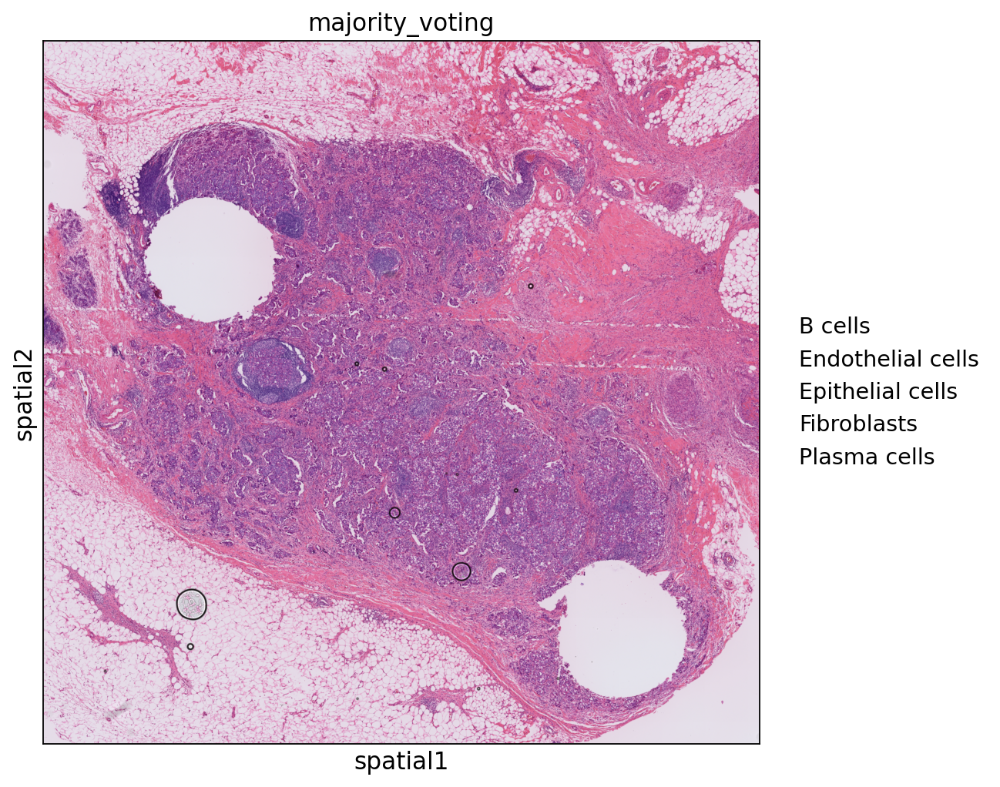

In [34]:
image_container = sq.im.ImageContainer(closed_image_array)
test.uns['image_tumour'] = image_container
sq.pa.spatial_scatter(test, color="majority_voting", alpha = 0, layer = 'image_tumour')

Shape of RGB image array: (1964, 2000, 3)
Corrected shape of RGB image array: (1964, 2000, 3)


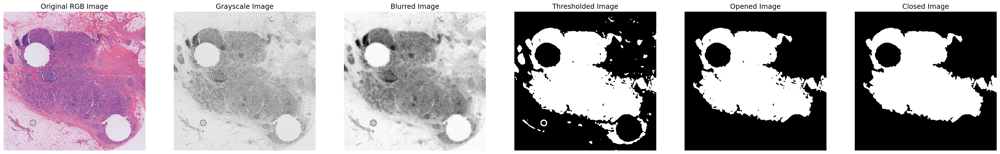

In [85]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

# Load the RGB image
image_path = "/tmp/work/Visium/2018838/PRE-01/spatial/tissue_hires_image.png"

rgb_image = sitk.ReadImage(image_path)

# Convert RGB to grayscale
if rgb_image.GetNumberOfComponentsPerPixel() == 3:
    gray_image = sitk.VectorIndexSelectionCast(rgb_image, 0, sitk.sitkFloat32)
    gray_image = sitk.RescaleIntensity(gray_image, outputMinimum=0, outputMaximum=255)
else:
    gray_image = sitk.RescaleIntensity(rgb_image, outputMinimum=0, outputMaximum=255)

# Apply Gaussian blur
smoothing_filter = sitk.SmoothingRecursiveGaussianImageFilter()
smoothing_filter.SetSigma(7.0)
blurred_image = smoothing_filter.Execute(gray_image)

# Apply Otsu Threshold
threshold_filter = sitk.OtsuThresholdImageFilter()
threshold_filter.SetInsideValue(1)  # Value for foreground pixels
threshold_filter.SetOutsideValue(0) # Value for background pixels
thresholded_image = threshold_filter.Execute(blurred_image)

# Apply Binary Opening to remove small objects
opening_filter = sitk.BinaryOpeningByReconstructionImageFilter()
opening_filter.SetKernelRadius(100)  # Adjust radius to control the size of particles to remove
opened_image = opening_filter.Execute(thresholded_image)

# Apply Binary Closing to fill small holes
closing_filter = sitk.BinaryClosingByReconstructionImageFilter()
closing_filter.SetKernelRadius(50)  # Adjust radius to control the size of holes to fill
closed_image = closing_filter.Execute(opened_image)

# Convert images to numpy arrays for plotting
rgb_image_array = sitk.GetArrayFromImage(rgb_image)
gray_image_array = sitk.GetArrayFromImage(gray_image)
blurred_image_array = sitk.GetArrayFromImage(blurred_image)
thresholded_image_array = sitk.GetArrayFromImage(thresholded_image)
opened_image_array = sitk.GetArrayFromImage(opened_image)
closed_image_array = sitk.GetArrayFromImage(closed_image)

# Check the shape of the RGB image array
print("Shape of RGB image array:", rgb_image_array.shape)

# Reorder RGB image array to have channels as the last dimension if necessary
if rgb_image_array.ndim == 3 and rgb_image_array.shape[1] == 3:
    rgb_image_array = np.transpose(rgb_image_array, (1, 2, 0))

# Ensure the RGB array shape is correct
print("Corrected shape of RGB image array:", rgb_image_array.shape)

# Plot the images
fig, axs = plt.subplots(1, 6, figsize=(36, 6))

# Show the original RGB image
axs[0].imshow(rgb_image_array)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

# Show the grayscale image
axs[1].imshow(gray_image_array, cmap='gray')
axs[1].set_title('Grayscale Image')
axs[1].axis('off')

# Show the blurred image
axs[2].imshow(blurred_image_array, cmap='gray')
axs[2].set_title('Blurred Image')
axs[2].axis('off')

# Show the thresholded image
axs[3].imshow(thresholded_image_array, cmap='gray')
axs[3].set_title('Thresholded Image')
axs[3].axis('off')

# Show the opened image
axs[4].imshow(opened_image_array, cmap='gray')
axs[4].set_title('Opened Image')
axs[4].axis('off')

# Show the closed image
axs[5].imshow(closed_image_array, cmap='gray')
axs[5].set_title('Closed Image')
axs[5].axis('off')

plt.show()

In [88]:
adata = visium_samples['PRE-01']

In [101]:
from PIL import Image

# Alternatively, load an image using PIL or another image library
image = Image.open(image_path)
image_data = np.array(image)

# Step 2: Create the ImageContainer
image_container = sq.im.ImageContainer(image_data, layer="original")

# Step 3: (Optional) Add another layer, such as a segmentation mask
segmentation_mask = closed_image_array  # Example segmentation mask
image_container.add_img(closed_image_array, layer="segmentation")

Adding image layer `original`
Adding image layer `segmentation`


In [104]:
test_seg = sq.im.calculate_image_features(adata,image_container, layer = 'segmentation',  features="segmentation")

Calculating features `['segmentation']` using `1` core(s)




  0%|          | 0/4668 [00:00<?, ?/s]

ValueError: Expected `height` to be in interval `[0, 1964]`, found `9413`.

In [99]:
adata.obsm['spatial'].shape

(4668, 2)

In [106]:
closed_image_array.shape

(1964, 2000)

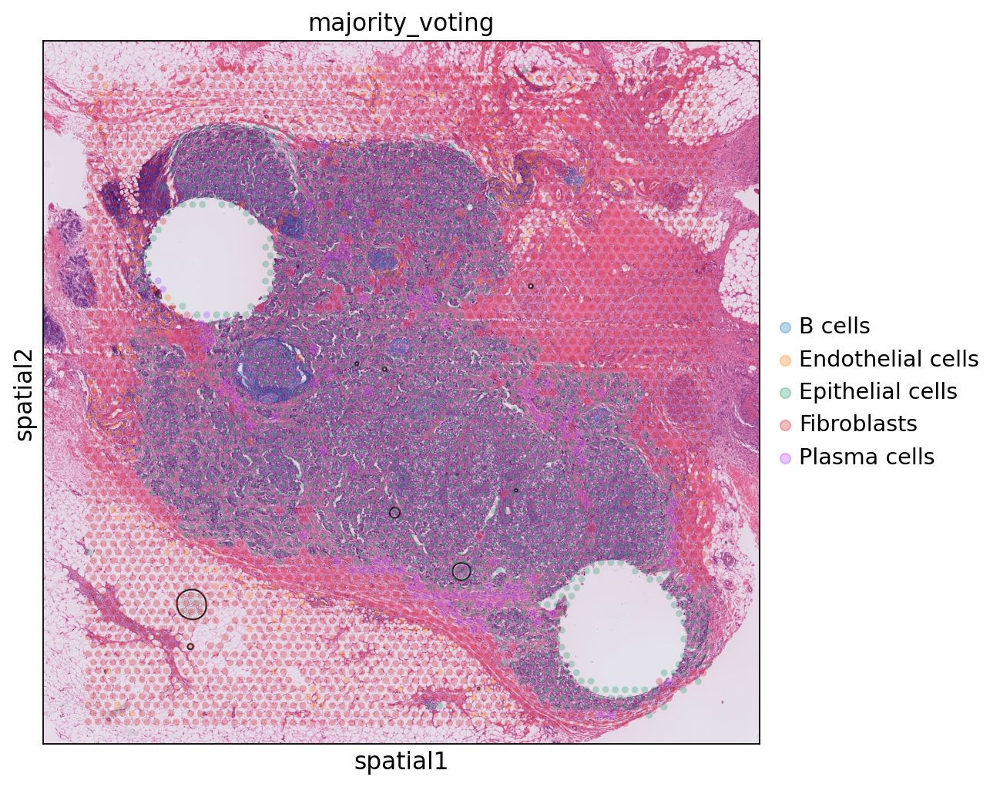

In [110]:
sq.pl.spatial_scatter(adata, color="majority_voting", alpha = 0.3)

In [119]:
adata.obs['spatial']

KeyError: 'spatial'

In [120]:
adata.uns['spatial']

{'PRE-01': {'metadata': {'chemistry_description': 'Visium V4 Slide',
   'software_version': 'spaceranger-2.0.0',
   'source_image_path': '/tmp/work/Visium/BRCA_2024/2018838/PRE-01/spatial'},
  'images': {'hires': array([[[226, 203, 223],
           [227, 204, 223],
           [216, 150, 192],
           ...,
           [177,  66, 115],
           [151,  53, 117],
           [157,  58, 121]],
   
          [[228, 210, 227],
           [223, 189, 212],
           [210, 144, 184],
           ...,
           [189,  86, 145],
           [193,  98, 157],
           [180,  87, 153]],
   
          [[227, 214, 229],
           [220, 168, 201],
           [211, 168, 198],
           ...,
           [155,  60, 126],
           [202,  82, 133],
           [211,  98, 150]],
   
          ...,
   
          [[229, 221, 233],
           [229, 222, 232],
           [228, 222, 233],
           ...,
           [229, 228, 236],
           [230, 228, 236],
           [230, 228, 235]],
   
          [[229

In [121]:
adata

AnnData object with n_obs × n_vars = 4668 × 18040
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'clusters', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'majority_voting_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

4668


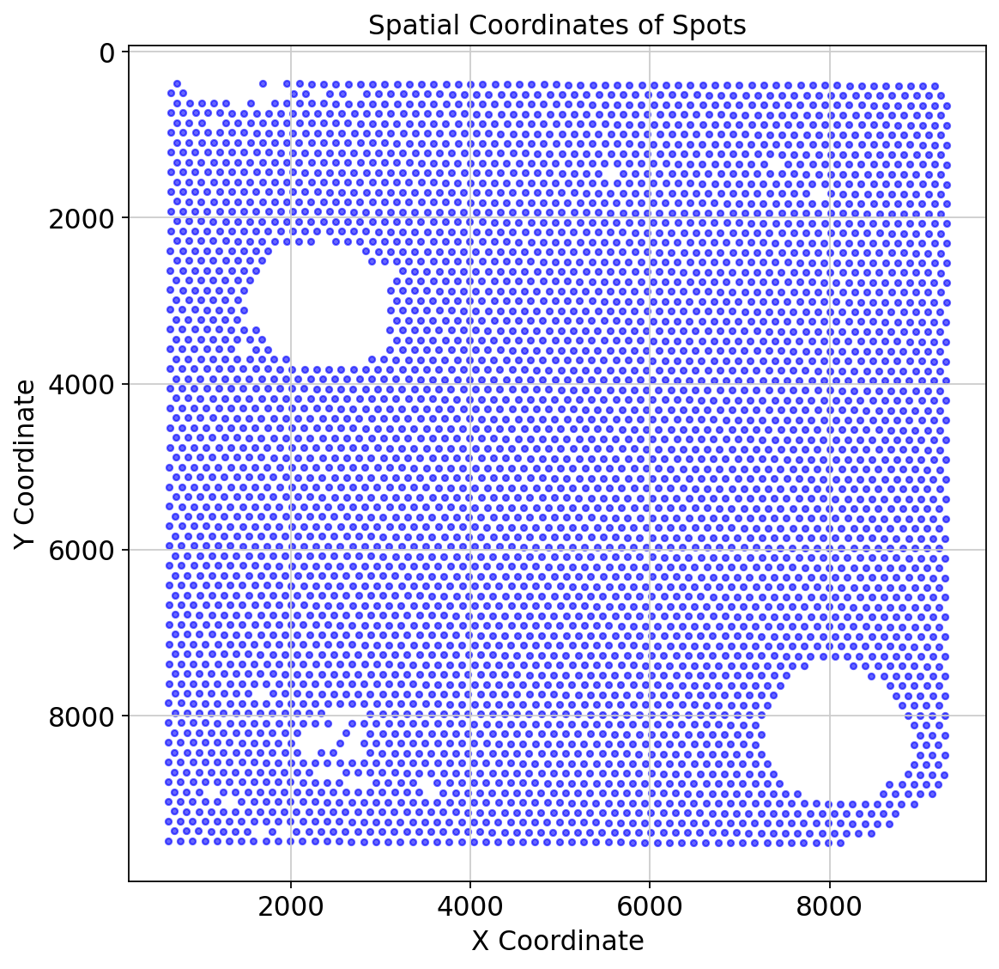

In [135]:
adata = visium_samples['PRE-01']

import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object
spatial_coords = adata.obsm['spatial']

print(len(spatial_coords))

# Plotting the spatial coordinates
plt.figure(figsize=(8, 8))
plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1], s=10, c='blue', alpha=0.6)
plt.gca().invert_yaxis()  # Invert the y-axis to match the usual tissue slide orientation
plt.title('Spatial Coordinates of Spots')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

In [139]:
max(adata.obsm['spatial'][:,1])

9533.0

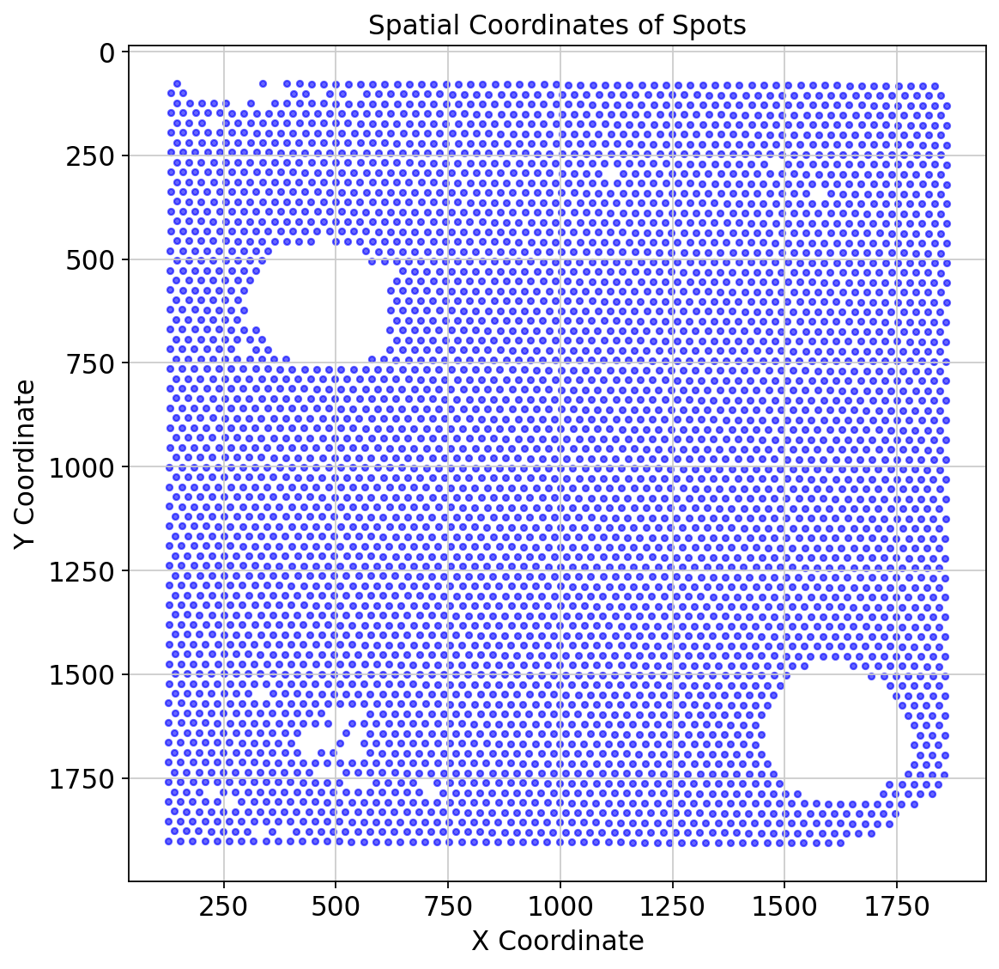

1861.98618
1906.7906600000001


In [150]:
import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object
spatial_coords = adata.obsm['spatial']*adata.uns['spatial']['PRE-01']['scalefactors']['tissue_hires_scalef']

# Plotting the spatial coordinates
plt.figure(figsize=(8, 8))
plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1], s=10, c='blue', alpha=0.6)
plt.gca().invert_yaxis()  # Invert the y-axis to match the usual tissue slide orientation
plt.title('Spatial Coordinates of Spots')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

print(max(spatial_coords[:, 0]))
print(max(spatial_coords[:, 1]))

In [165]:

np.any(np.isnan(adata.obsm['spatial']))

np.argwhere(np.isnan(adata.obsm['spatial']))

array([[3237,    0],
       [3237,    1]])

In [153]:
scaled_spatial_coords = adata.obsm['spatial']*adata.uns['spatial']['PRE-01']['scalefactors']['tissue_hires_scalef']
closed_image_array.shape

(1964, 2000)

In [154]:
scaled_spatial_coords.shape

(4668, 2)

In [142]:
adata.uns['spatial']

{'PRE-01': {'metadata': {'chemistry_description': 'Visium V4 Slide',
   'software_version': 'spaceranger-2.0.0',
   'source_image_path': '/tmp/work/Visium/BRCA_2024/2018838/PRE-01/spatial'},
  'images': {'hires': array([[[226, 203, 223],
           [227, 204, 223],
           [216, 150, 192],
           ...,
           [177,  66, 115],
           [151,  53, 117],
           [157,  58, 121]],
   
          [[228, 210, 227],
           [223, 189, 212],
           [210, 144, 184],
           ...,
           [189,  86, 145],
           [193,  98, 157],
           [180,  87, 153]],
   
          [[227, 214, 229],
           [220, 168, 201],
           [211, 168, 198],
           ...,
           [155,  60, 126],
           [202,  82, 133],
           [211,  98, 150]],
   
          ...,
   
          [[229, 221, 233],
           [229, 222, 232],
           [228, 222, 233],
           ...,
           [229, 228, 236],
           [230, 228, 236],
           [230, 228, 235]],
   
          [[229

In [145]:
adata.uns['spatial']['images']

KeyError: 'images'

In [148]:
adata.uns['spatial']['PRE-01']['scalefactors']['tissue_hires_scalef']

0.20002

In [171]:
len(scaled_spatial_coords)

4668

In [156]:
closed_image_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [197]:
coordinates = adata.obsm['spatial'] * adata.uns['spatial']['PRE-01']['scalefactors']['tissue_hires_scalef']


In [175]:
import numpy as np

# Assuming coordinates are in the following format:
coordinates = adata.obsm['spatial'] * adata.uns['spatial']['PRE-01']['scalefactors']['tissue_hires_scalef']
binarized_image = closed_image_array

overlap_vector = []

for coord in coordinates:
    x, y = coord
    
    # Check if either x or y is NaN
    if np.isnan(x) or np.isnan(y):
        overlap_vector.append(False)
        continue
    
    # Round the coordinates to the nearest integer
    x_rounded = round(x)
    y_rounded = round(y)
    
    # Ensure the rounded coordinates are within the image bounds
    if 0 <= x_rounded < binarized_image.shape[1] and 0 <= y_rounded < binarized_image.shape[0]:
        if binarized_image[y_rounded, x_rounded] == 1:
            overlap_vector.append(True)
        else:
            overlap_vector.append(False)
    else:
        # Handle out-of-bounds coordinates (append False)
        overlap_vector.append(False)


filtered_coordinates = coordinates[overlap_vector]

# Resulting boolean vector
print(len(overlap_vector))

4668


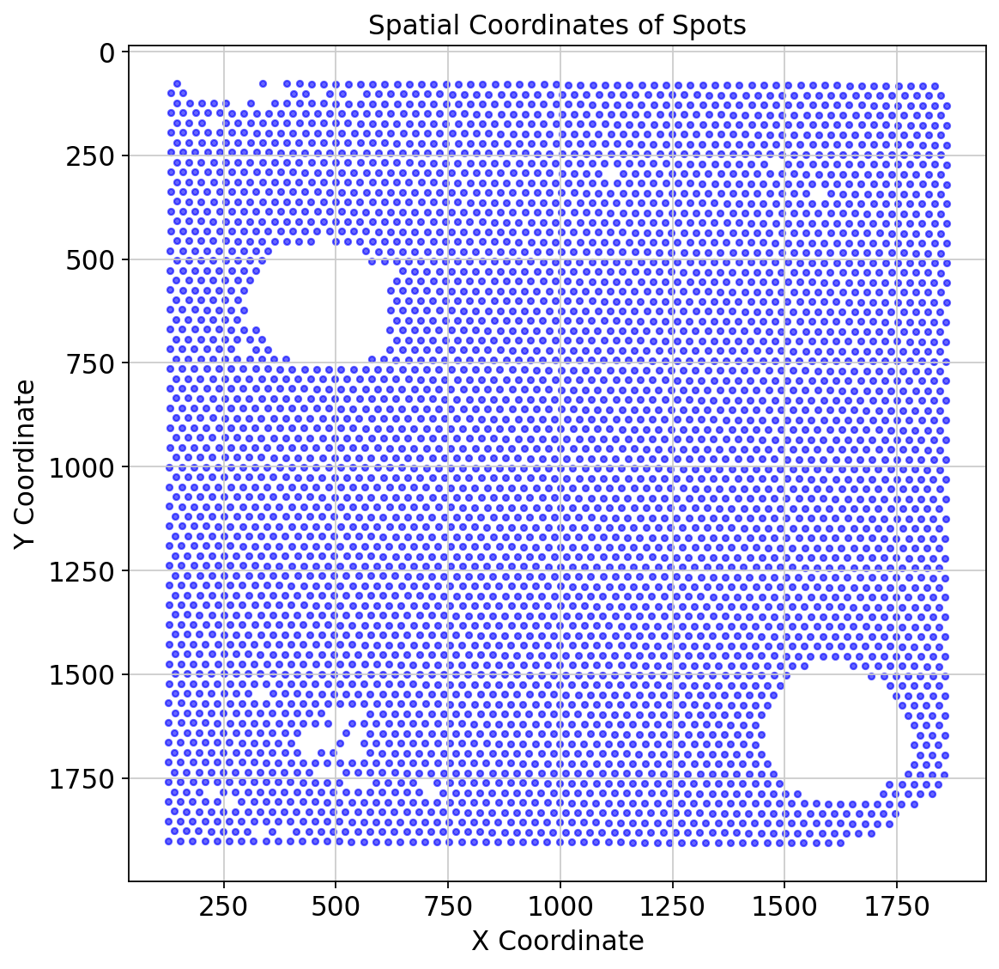

1861.98618
1906.7906600000001


In [181]:
import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object

# Plotting the spatial coordinates
plt.figure(figsize=(8, 8))
plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1], s=10, c='blue', alpha=0.6)
plt.gca().invert_yaxis()  # Invert the y-axis to match the usual tissue slide orientation
plt.title('Spatial Coordinates of Spots')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

print(max(spatial_coords[:, 0]))
print(max(spatial_coords[:, 1]))

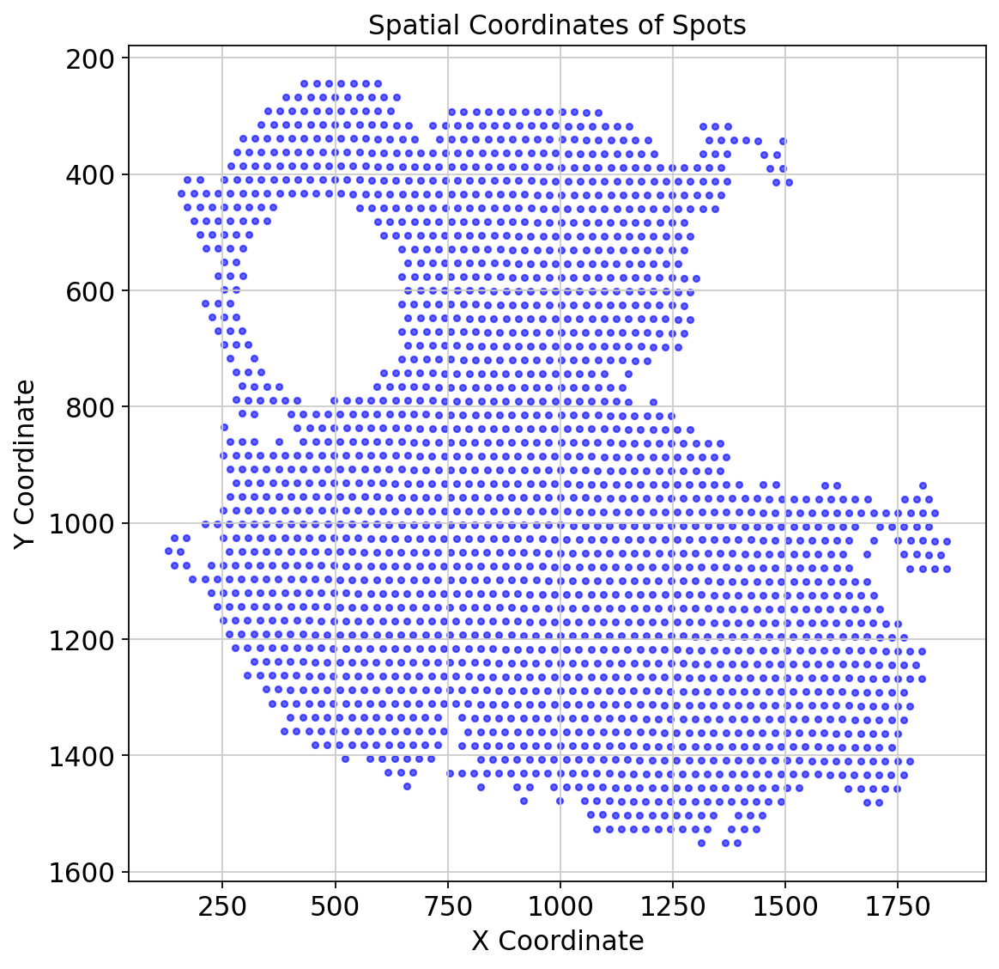

1861.98618
1906.7906600000001


In [179]:
import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object

# Plotting the spatial coordinates
plt.figure(figsize=(8, 8))
plt.scatter(filtered_coordinates[:, 0], filtered_coordinates[:, 1], s=10, c='blue', alpha=0.6)
plt.gca().invert_yaxis()  # Invert the y-axis to match the usual tissue slide orientation
plt.title('Spatial Coordinates of Spots')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

print(max(spatial_coords[:, 0]))
print(max(spatial_coords[:, 1]))

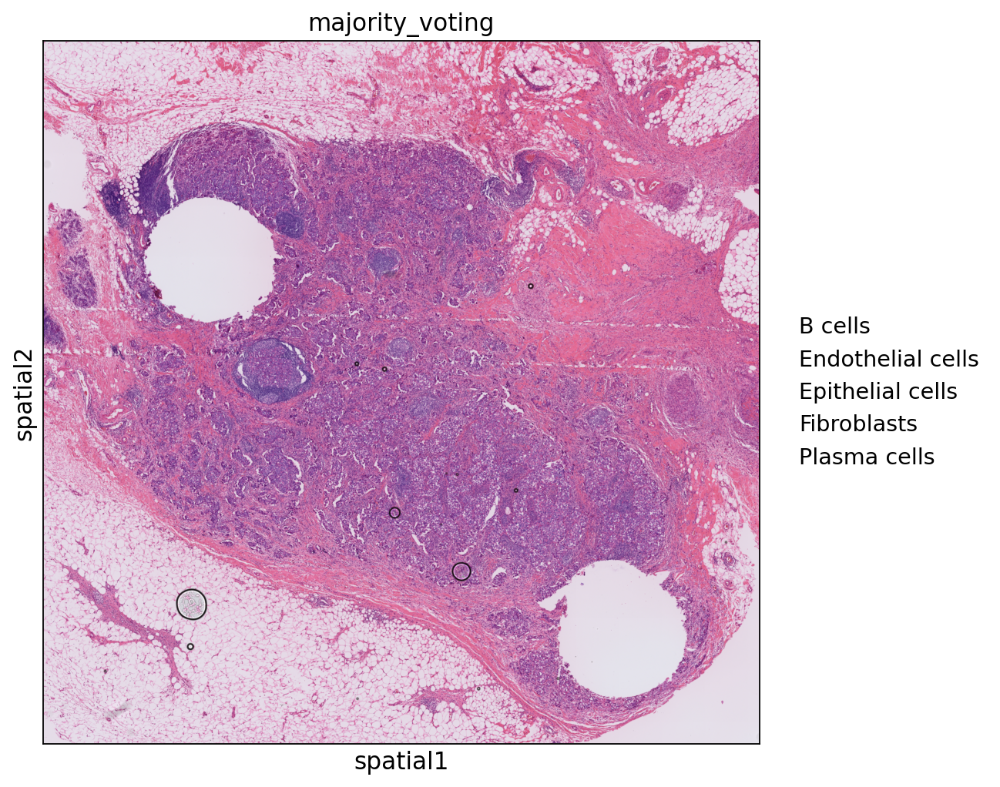

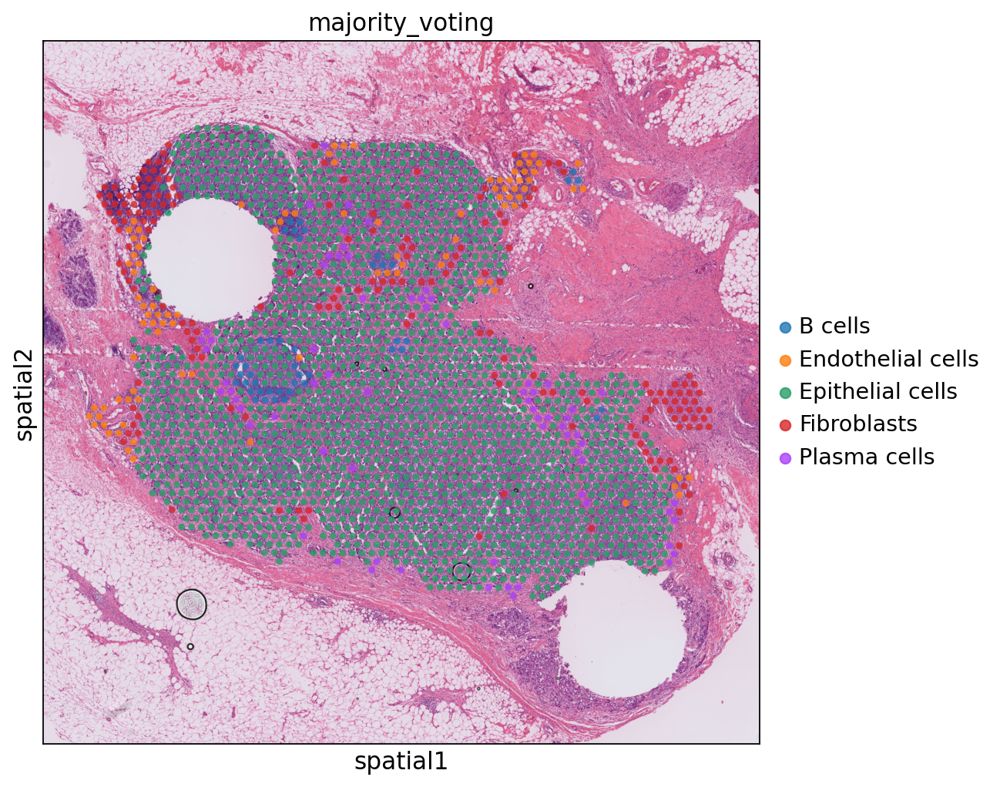

In [191]:
filtered_adata = adata[overlap_vector, :]

sq.pl.spatial_scatter(adata, color="majority_voting", alpha = 0)
sq.pl.spatial_scatter(filtered_adata, color="majority_voting", alpha = 0.8)

In [186]:
adata.obs['tumour_sites'] = overlap_vector

In [192]:
image_path = "/tmp/work/Visium/BRCA_2024/figures"

In [193]:
image_path

'/tmp/work/Visium/2018838/PRE-01/spatial/tissue_hires_image.png'

In [ ]:
Visium/BRCA_2024/figures

In [ ]:
os.path.join(dir_name, base_filename + '.' + filename_suffix)

'PRE-01'

In [ ]:
sq.pl.spatial_scatter(adata, color="majority_voting", alpha = 0.2)

In [219]:
import importlib

from os import sys
sys.path.append('/tmp/work/Visium/BRCA_2024/brca_scripts')

# from tumourSegmentation import retrieveTumourMask

# importlib.reload(tumourSegmentation)


import importlib
import tumourSegmentation  # Import the module
importlib.reload(tumourSegmentation)  # Reload the module

from tumourSegmentation import retrieveTumourMask

In [220]:
image_path = "/tmp/work/Visium/2018838/PRE-01/spatial/tissue_hires_image.png"

subset_adata = retrieveTumourMask(hires_image_path,adata)

Shape of RGB image array: (1964, 2000, 3)
Corrected shape of RGB image array: (1964, 2000, 3)


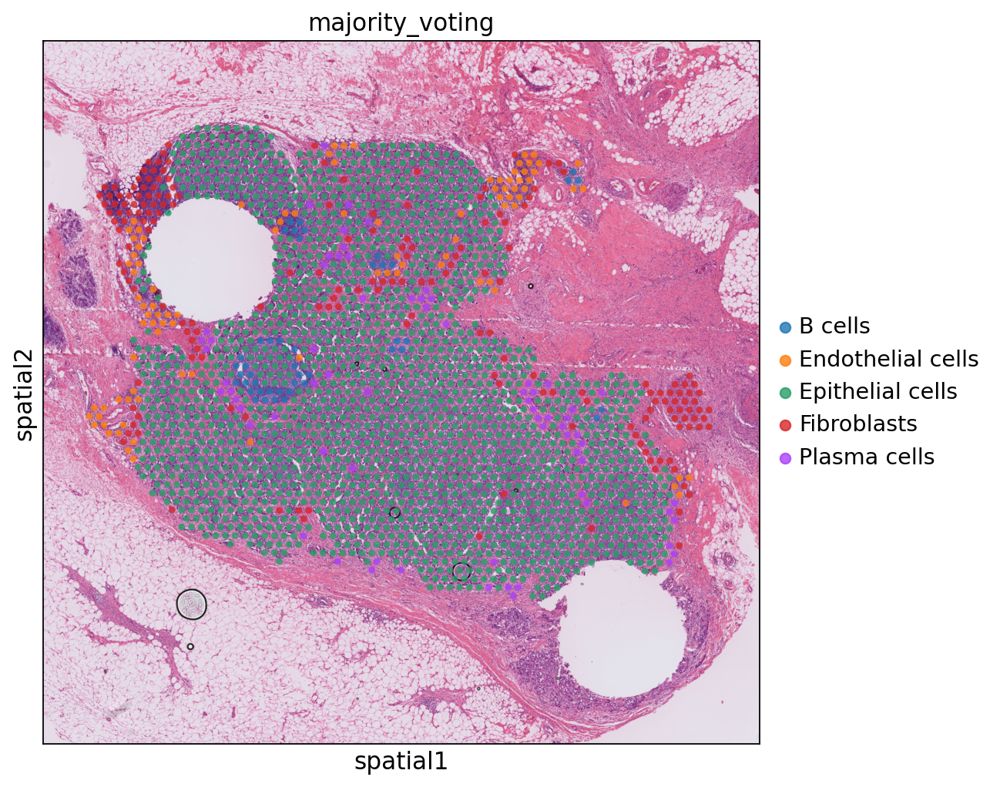

In [221]:
sq.pl.spatial_scatter(subset_adata, color="majority_voting", alpha = 0.8)